# Task1

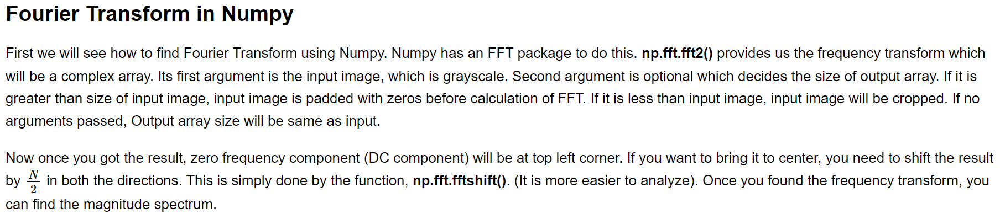

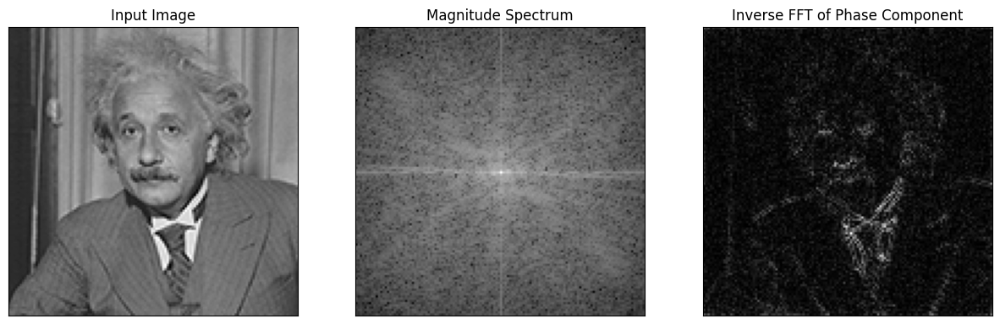

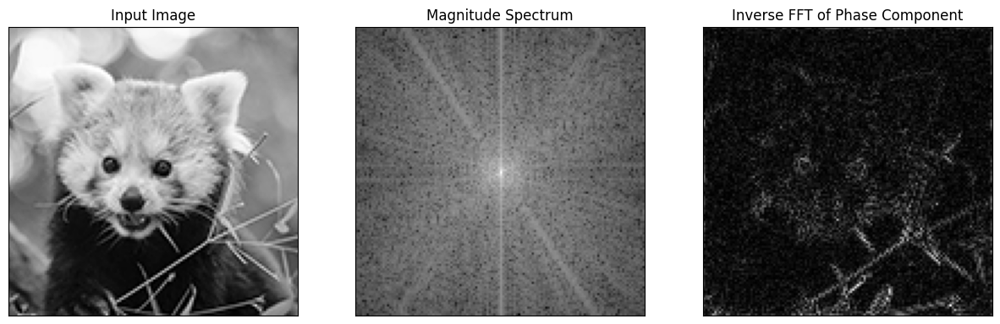

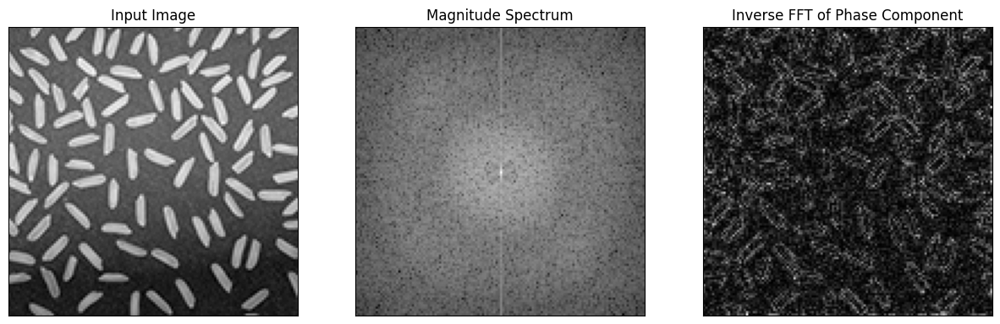

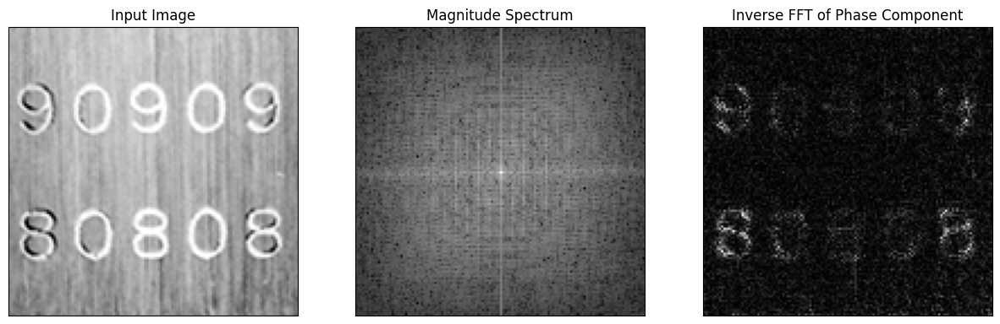

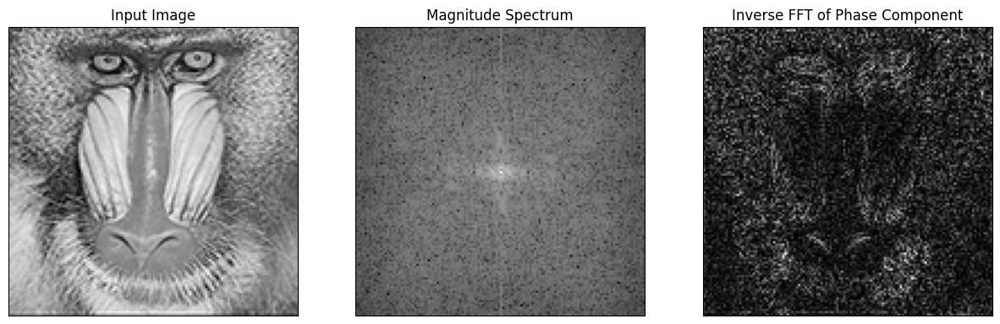

In [58]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def display_fft(image):
    fourier_transform = np.fft.fft2(image)
    center_shift = np.fft.fftshift(fourier_transform)
    magnitude_spectrum = 20 * np.log(np.abs(center_shift))

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1), plt.imshow(image, cmap='gray')
    plt.title('Input Image'), plt.xticks([]), plt.yticks([])

    plt.subplot(1, 3, 2), plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])

    phase_only = np.angle(center_shift)
    f_complex = np.exp(1j * phase_only)
    inverse_fft = np.fft.ifft2(np.fft.ifftshift(f_complex))
    inverse_fft = np.abs(inverse_fft)

    plt.subplot(1, 3, 3), plt.imshow(inverse_fft, cmap='gray')
    plt.title('Inverse FFT of Phase Component'), plt.xticks([]), plt.yticks([])

    plt.show()


image_paths = ['/content/einstein.png', '/content/panda.png', '/content/rice.png', '/content/code.png', '/content/mandrill.png']

for image_path in image_paths:
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    display_fft(image)


In [44]:
print(fshift)

[[-6821.            +0.j         -4780.14699701 +1145.80804064j
   1224.79714318 -4357.80949951j ... -3135.2481114  +6777.31551145j
   1224.79714318 +4357.80949951j -4780.14699701 -1145.80804064j]
 [-4724.70702231 -6985.0054045j  -1263.45442069 +8416.1808294j
    278.71244793 +2535.92542997j ... -3304.39797302 -3821.50330927j
   3961.37949165 -1137.96214327j -4360.30893367 +8172.48467476j]
 [-3723.05477135 -4796.17206394j -2387.83617621 +3537.64786194j
    832.15201765 +5381.04767915j ...  4888.42311589 -6182.86811606j
   1703.87741837 +3943.3195917j  -3320.60603028  -941.99498486j]
 ...
 [-4990.47876008 -1036.75540066j  6348.80791854 +1422.33559093j
  -9827.26623365 +2702.98329308j ...  1163.75204057 -3653.53508772j
   1786.36423042 -2529.36002289j -2437.21526918 +1612.9367059j ]
 [-3723.05477135 +4796.17206394j -3320.60603028  +941.99498486j
   1703.87741837 -3943.3195917j  ...  9527.26647406   -65.16332554j
    832.15201765 -5381.04767915j -2387.83617621 -3537.64786194j]
 [-4724.707

# Task 2

In the field of Image Processing, Butterworth Lowpass Filter (BLPF) is used for image smoothing in the frequency domain. It removes high-frequency noise from a digital image and preserves low-frequency components. The transfer function of BLPF of order n is defined as

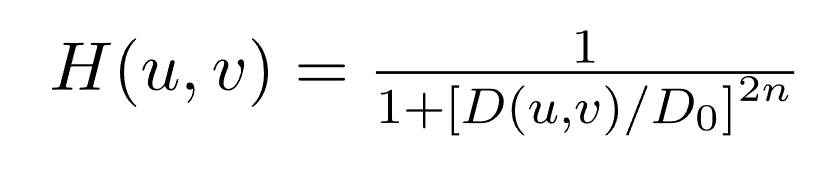

Processing image: /content/einstein.png


<ipython-input-59-e08e968aa1f2>:81: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr = peak_signal_noise_ratio(image, filtered_image)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:348: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  return func(*args, **kwargs)


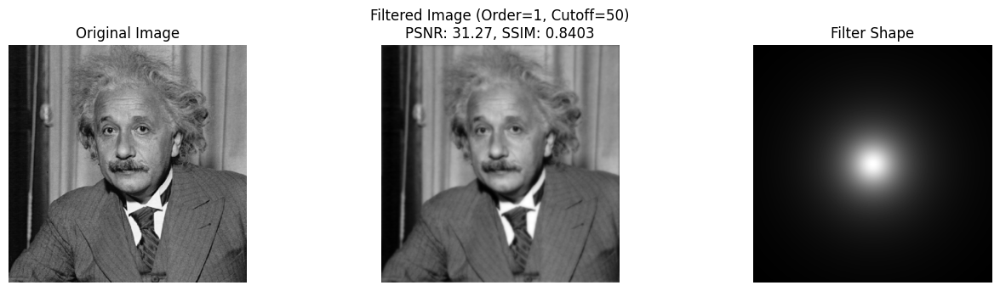

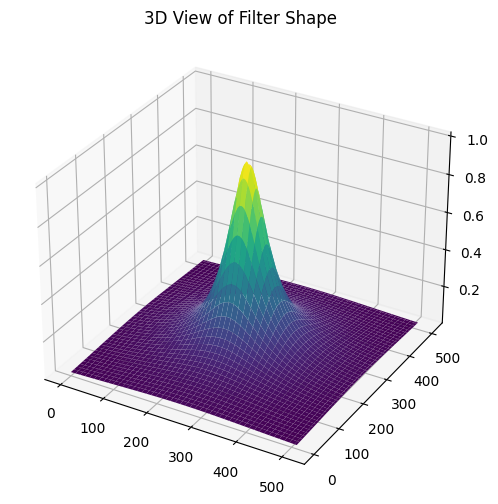

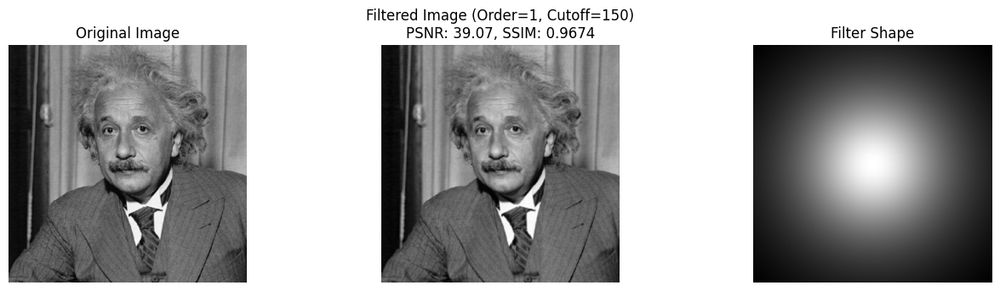

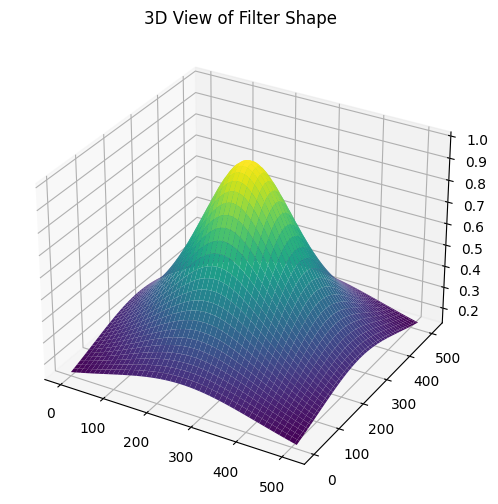

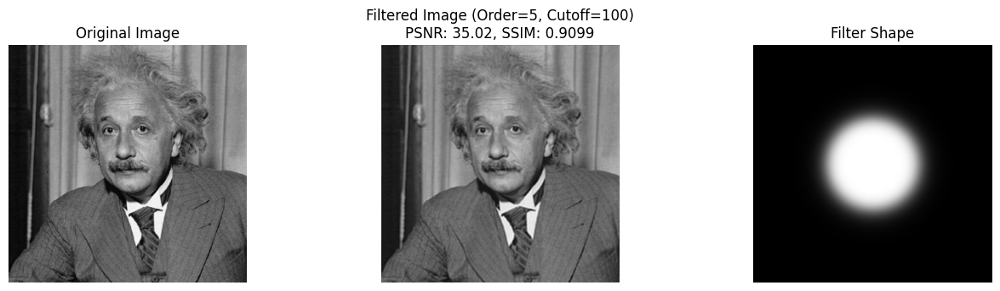

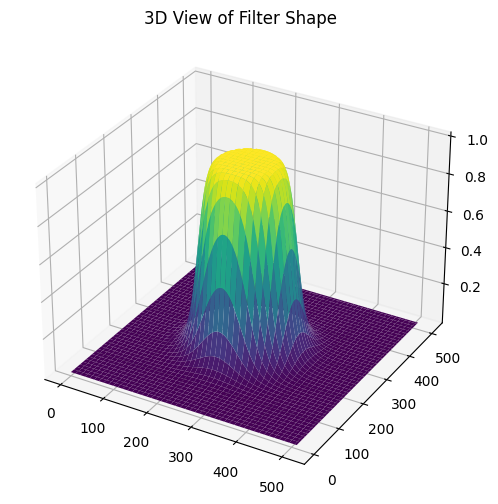

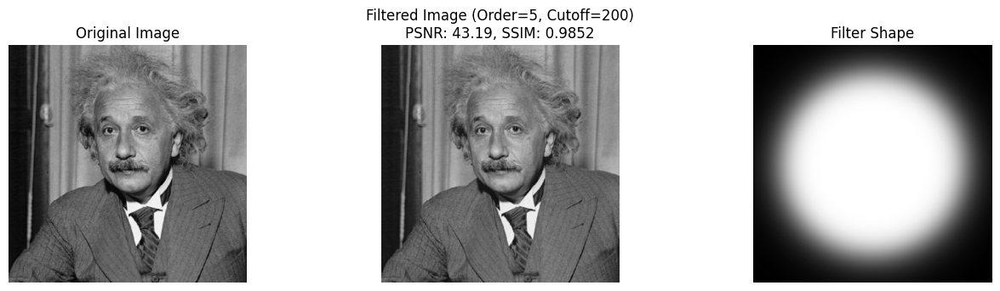

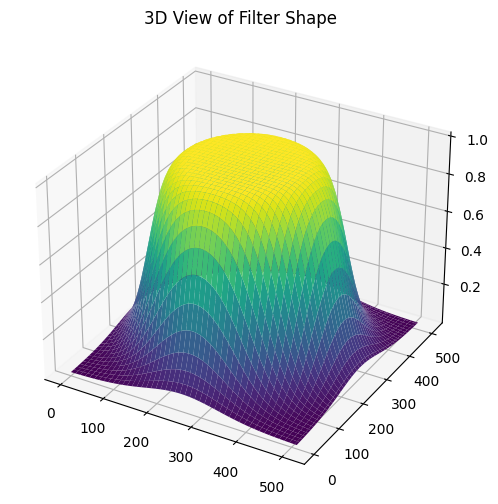

Processing image: /content/panda.png


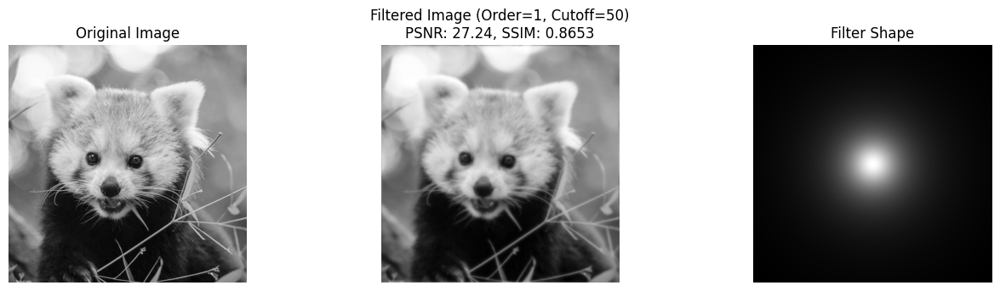

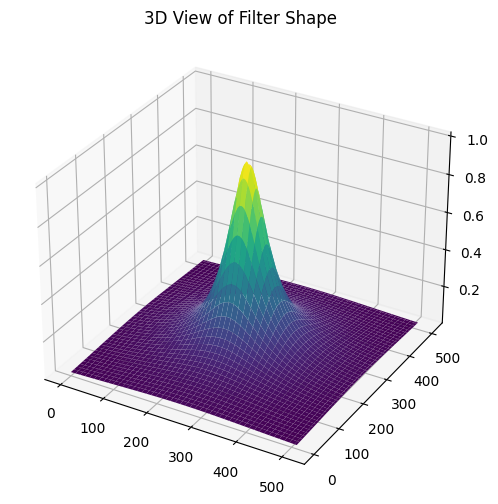

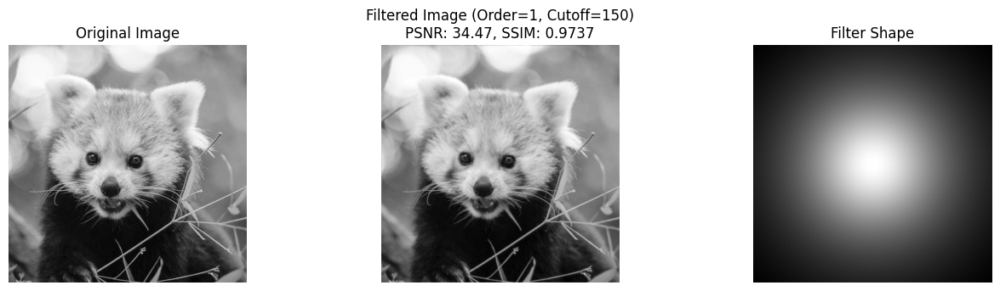

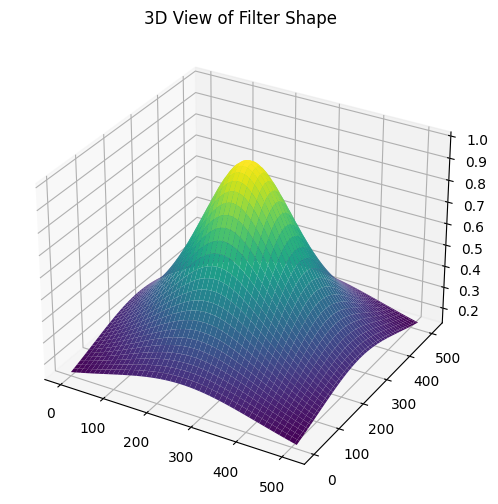

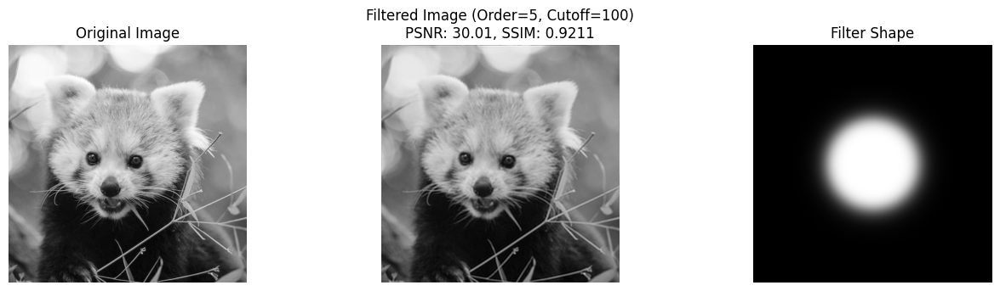

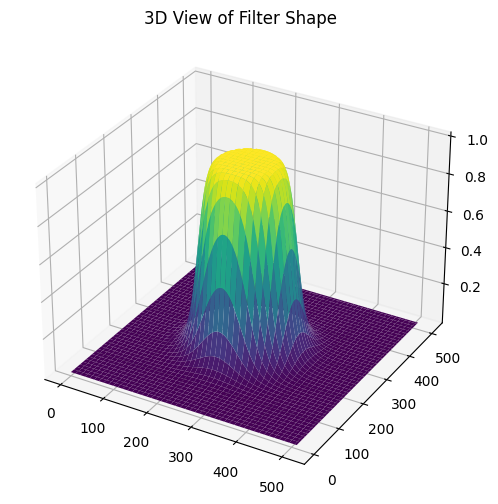

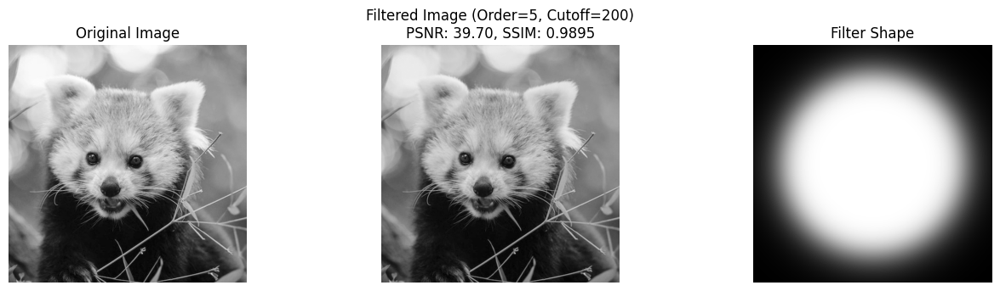

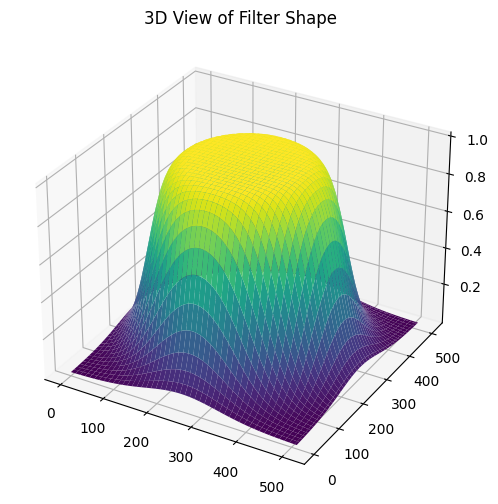

Processing image: /content/rice.png


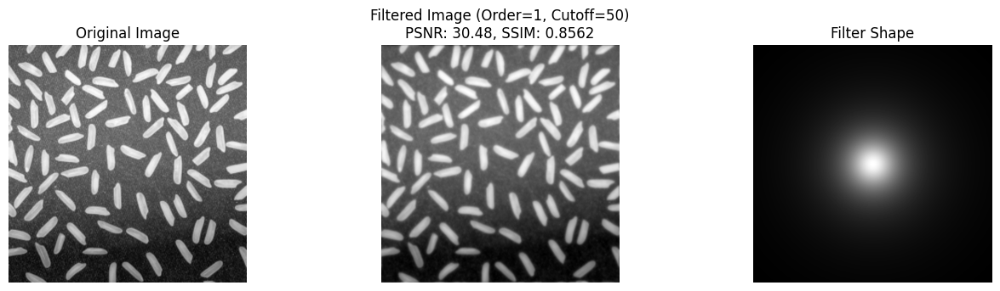

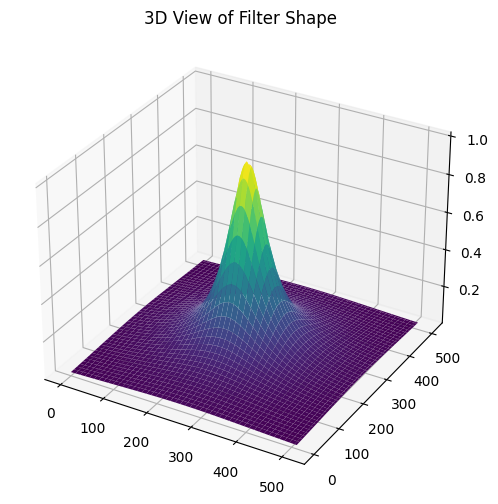

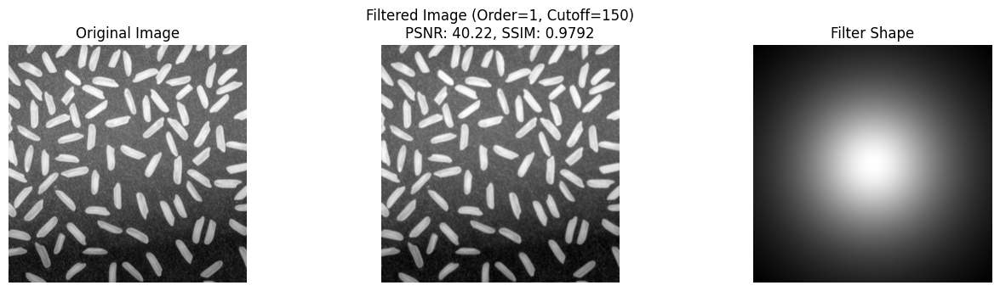

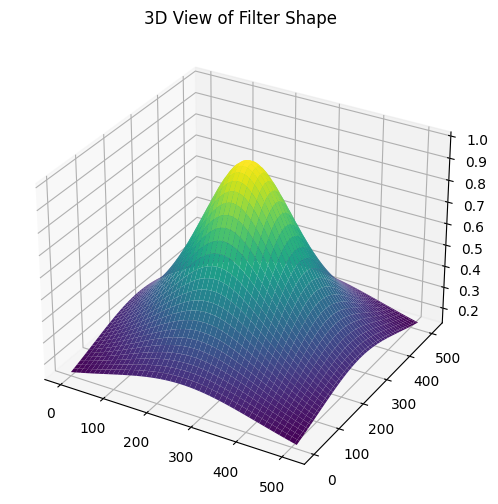

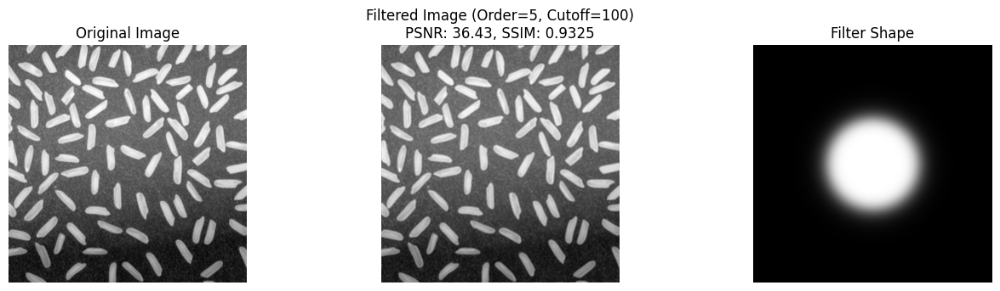

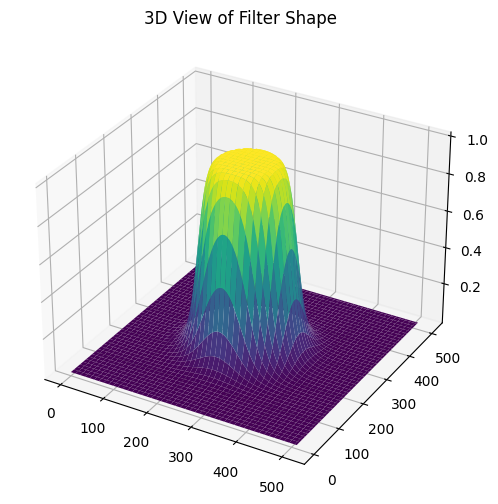

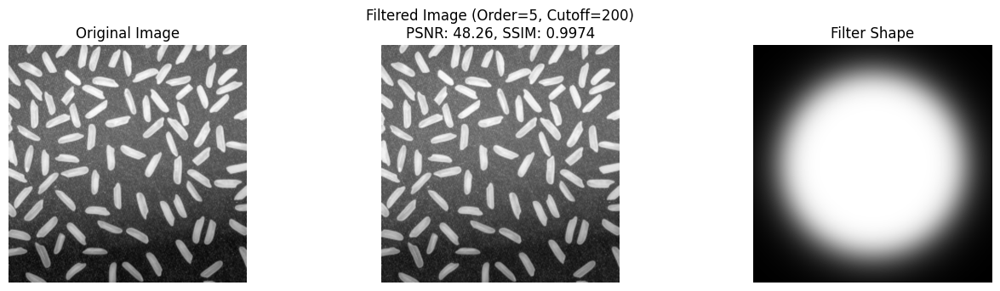

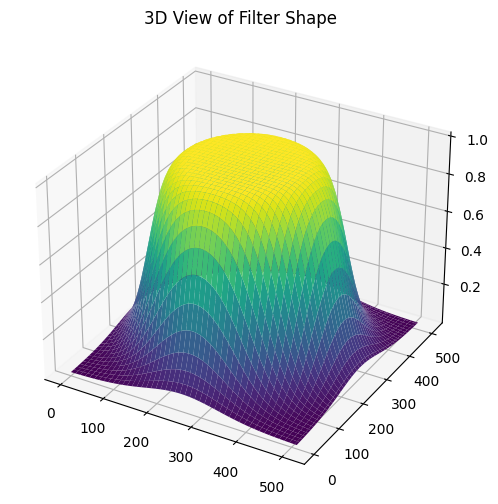

Processing image: /content/code.png


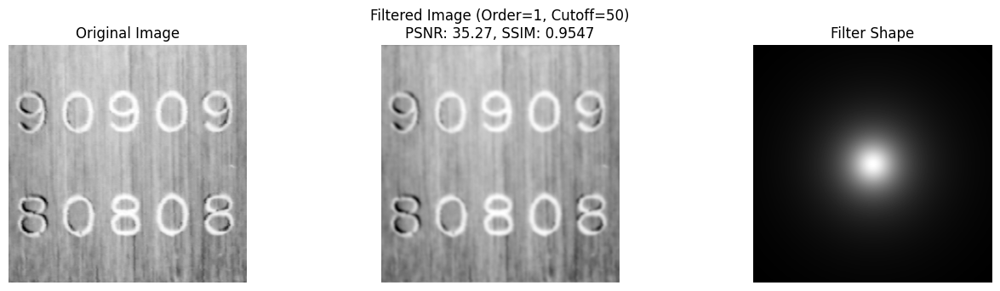

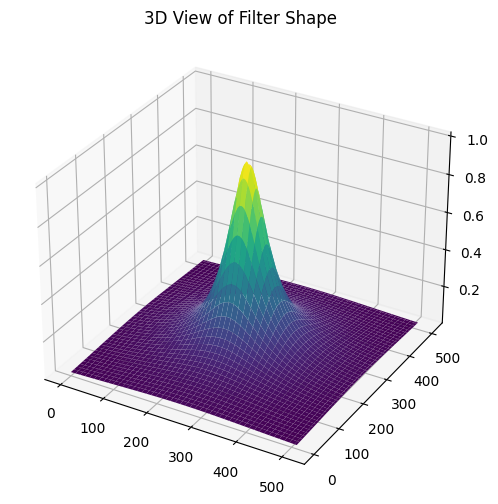

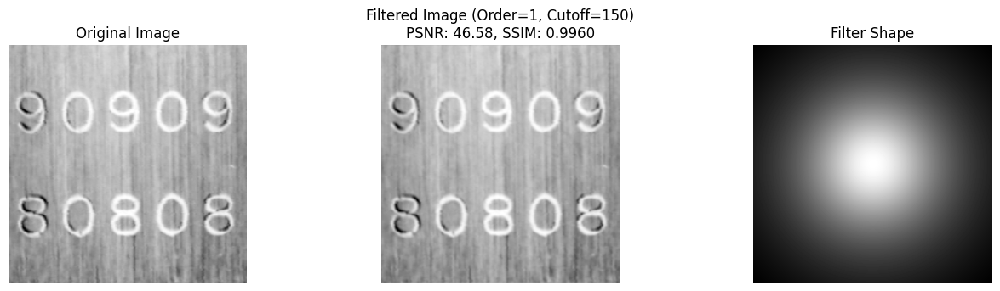

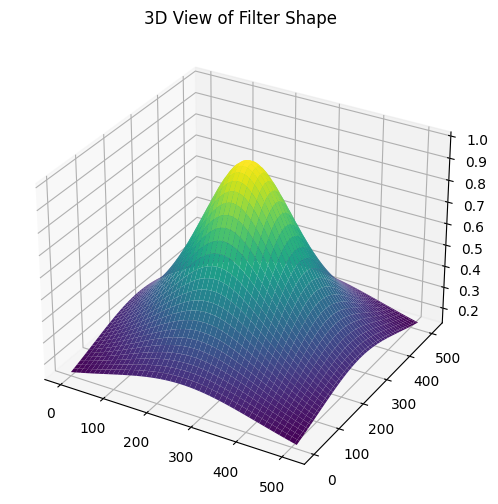

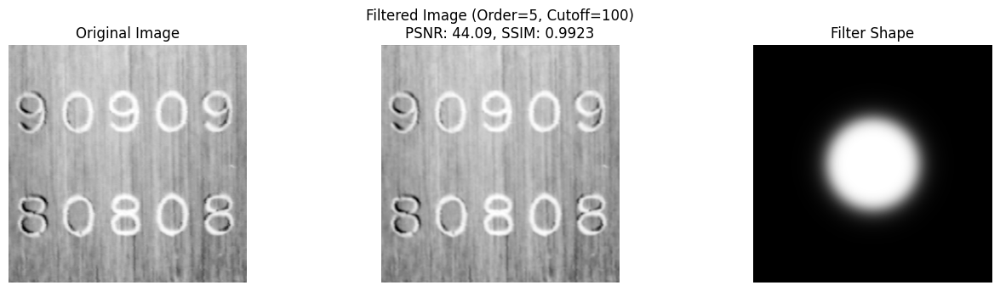

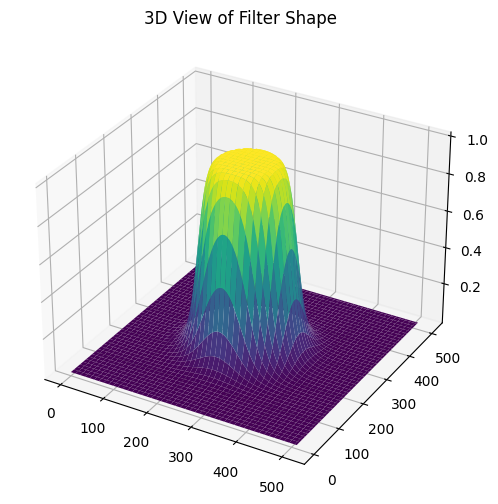

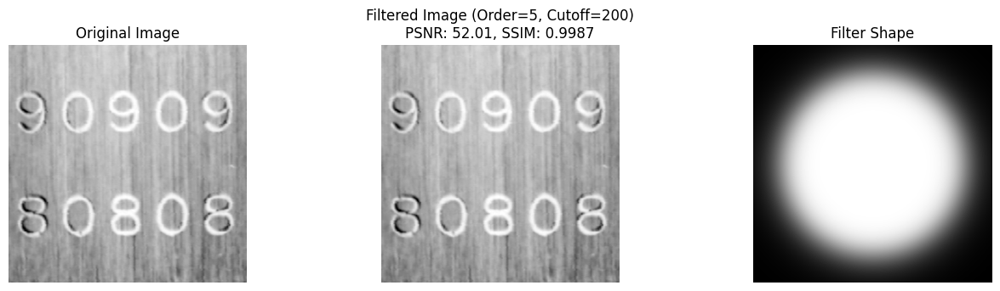

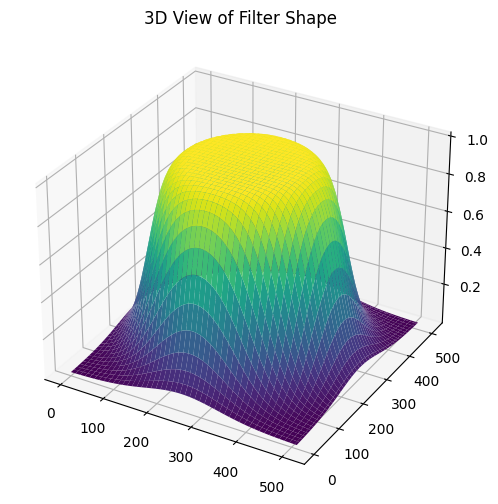

Processing image: /content/mandrill.png


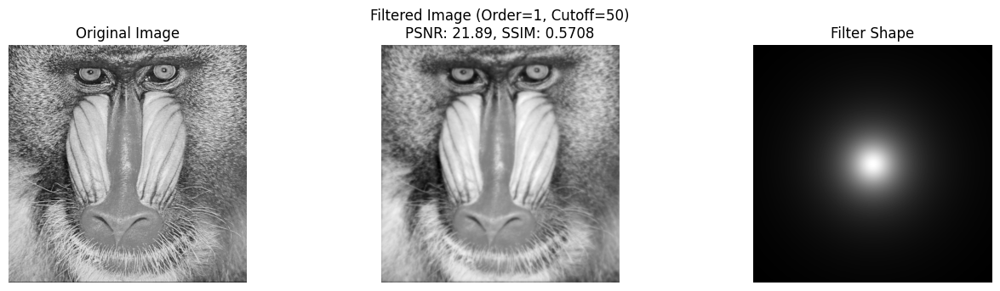

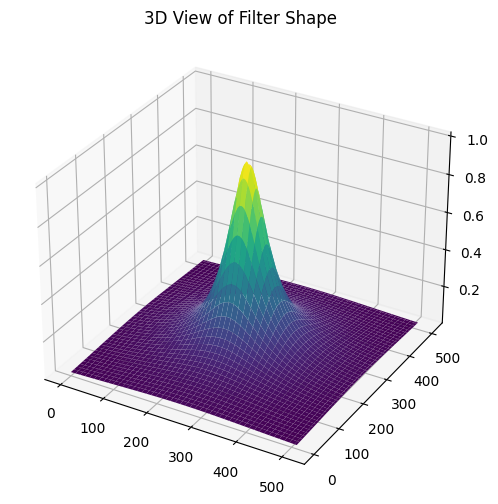

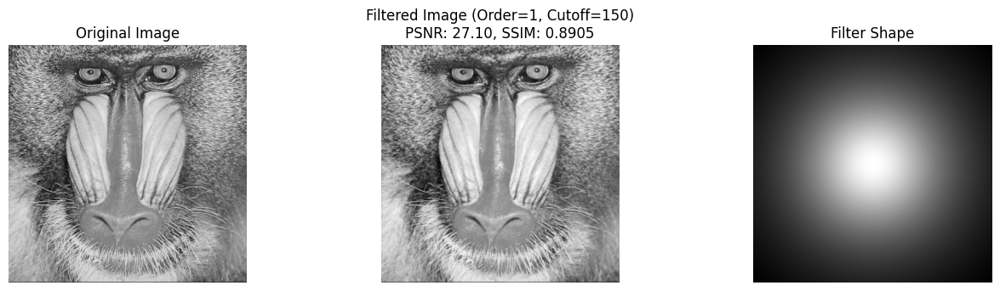

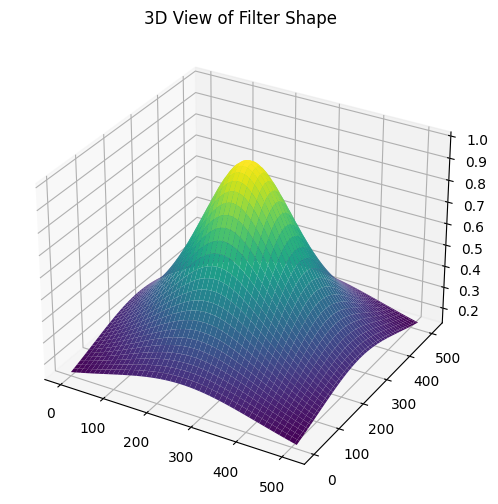

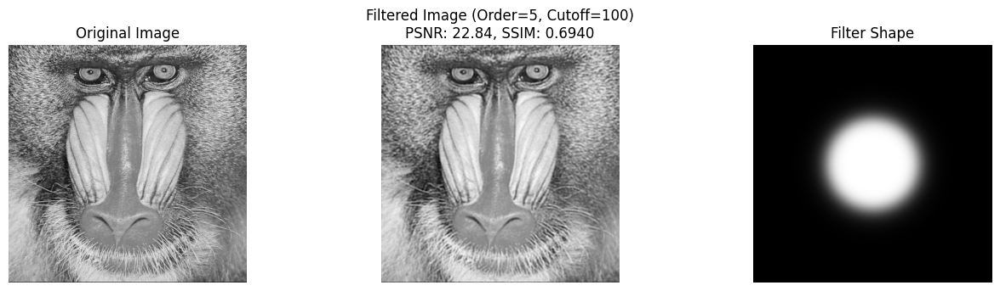

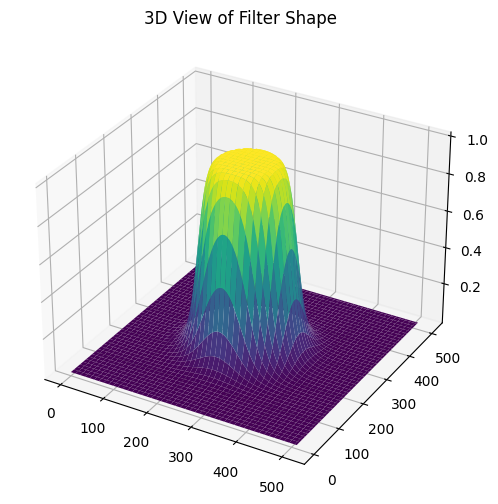

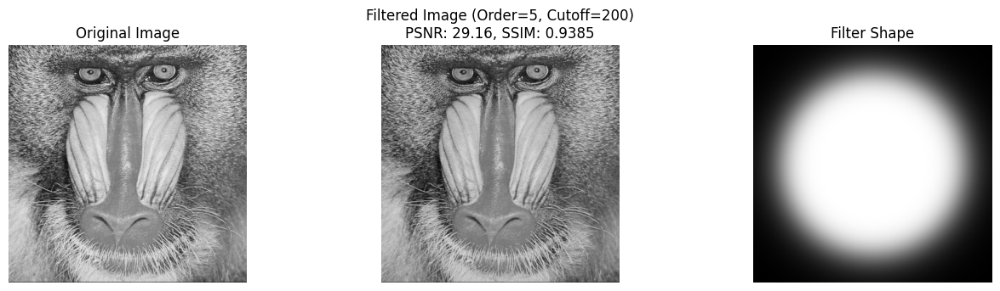

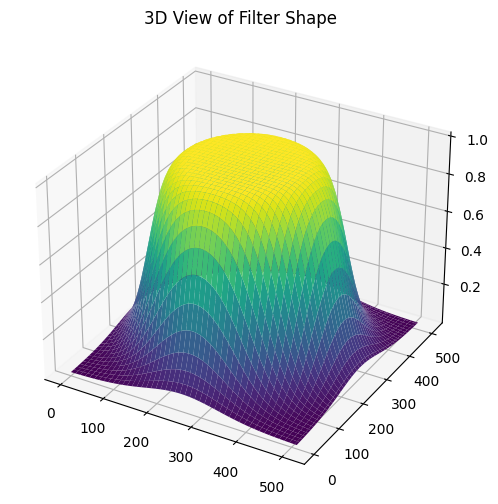

Results:
No   Order  Cutoff Frequency  PSNR     SSIM    
1    1      50                31.2731  0.84029579
2    1      150               39.0714  0.96736328
3    5      100               35.0170  0.90994919
4    5      200               43.1873  0.98515334
5    1      50                27.2436  0.86534778
6    1      150               34.4716  0.97374470
7    5      100               30.0102  0.92108261
8    5      200               39.7044  0.98950106
9    1      50                30.4756  0.85616738
10   1      150               40.2238  0.97917855
11   5      100               36.4338  0.93253162
12   5      200               48.2642  0.99738139
13   1      50                35.2714  0.95468210
14   1      150               46.5787  0.99603456
15   5      100               44.0921  0.99234666
16   5      200               52.0112  0.99868119
17   1      50                21.8916  0.57084312
18   1      150               27.0997  0.89053126
19   5      100               22.8377  0.69

In [59]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from mpl_toolkits.mplot3d import Axes3D
from math import sqrt

def distance(point1, point2):
    return sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

def display_freq(freq):
    return 20 * np.log(np.abs(freq))

def butterworth_lowpass(D0, image_shape, order):
    rows, cols = image_shape[:2]
    center = (rows/2, cols/2)
    base = np.zeros(image_shape[:2])
    for x in range(cols):
        for y in range(rows):
            base[y, x] = 1 / (1 + (distance((y, x), center) / D0) ** (2 * order))
    return base

def display_freq(freq):
    return 20 * np.log(np.abs(freq))

def plot_results(original, filtered, filter_shape, cutoff, order, psnr, ssim):
    plt.figure(figsize=(16, 8))

    plt.subplot(2, 3, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(filtered, cmap='gray')
    plt.title(f'Filtered Image (Order={order}, Cutoff={cutoff})\nPSNR: {psnr:.2f}, SSIM: {ssim:.4f}')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(filter_shape, cmap='gray')
    plt.title('Filter Shape')
    plt.axis('off')

    # Plot the 3D view of the filter shape
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    x = np.arange(filter_shape.shape[1])
    y = np.arange(filter_shape.shape[0])
    X, Y = np.meshgrid(x, y)
    ax.plot_surface(X, Y, filter_shape, cmap='viridis')
    ax.set_title('3D View of Filter Shape')
    plt.show()

# Load the 5 images
image_paths = ['/content/einstein.png', '/content/panda.png', '/content/rice.png', '/content/code.png', '/content/mandrill.png']
images = [cv2.imread(path, cv2.IMREAD_GRAYSCALE) for path in image_paths]

# Define the filter parameters
filter_params = [
    {'order': 1, 'cutoff': 50},
    {'order': 1, 'cutoff': 150},
    {'order': 5, 'cutoff': 100},
    {'order': 5, 'cutoff': 200}
]

# Process each image with different filter parameters
results = []
for idx, (image, path) in enumerate(zip(images, image_paths)):
    print(f"Processing image: {path}")
    for params in filter_params:
        # Design the Butterworth lowpass filter
        butterworth_filter = butterworth_lowpass(params['cutoff'], image.shape, params['order'])

        # Apply the filter in the frequency domain
        f = np.fft.fft2(image)
        fshift = np.fft.fftshift(f)
        filtered_f = fshift * butterworth_filter
        filtered_image = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_f)))

        # Calculate PSNR and SSIM
        psnr = peak_signal_noise_ratio(image, filtered_image)
        ssim = structural_similarity(image, filtered_image)

        # Plot the results
        plot_results(image, filtered_image, butterworth_filter, params['cutoff'], params['order'], psnr, ssim)

        # Store the results
        results.append({
            'Image': idx + 1,
            'Order': params['order'],
            'Cutoff Frequency': params['cutoff'],
            'PSNR': psnr,
            'SSIM': ssim
        })

# Display the results table
print("Results:")
print("{:<4} {:<6} {:<17} {:<8} {:<8}".format("No", "Order", "Cutoff Frequency", "PSNR", "SSIM"))
for idx, res in enumerate(results):
    print("{:<4} {:<6} {:<17} {:<8.4f} {:<8.8f}".format(idx+1, res['Order'], res['Cutoff Frequency'], res['PSNR'], res['SSIM']))

# Task 3

<ipython-input-55-bb2babc83ce0>:57: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr = peak_signal_noise_ratio(original_image, denoised_image)


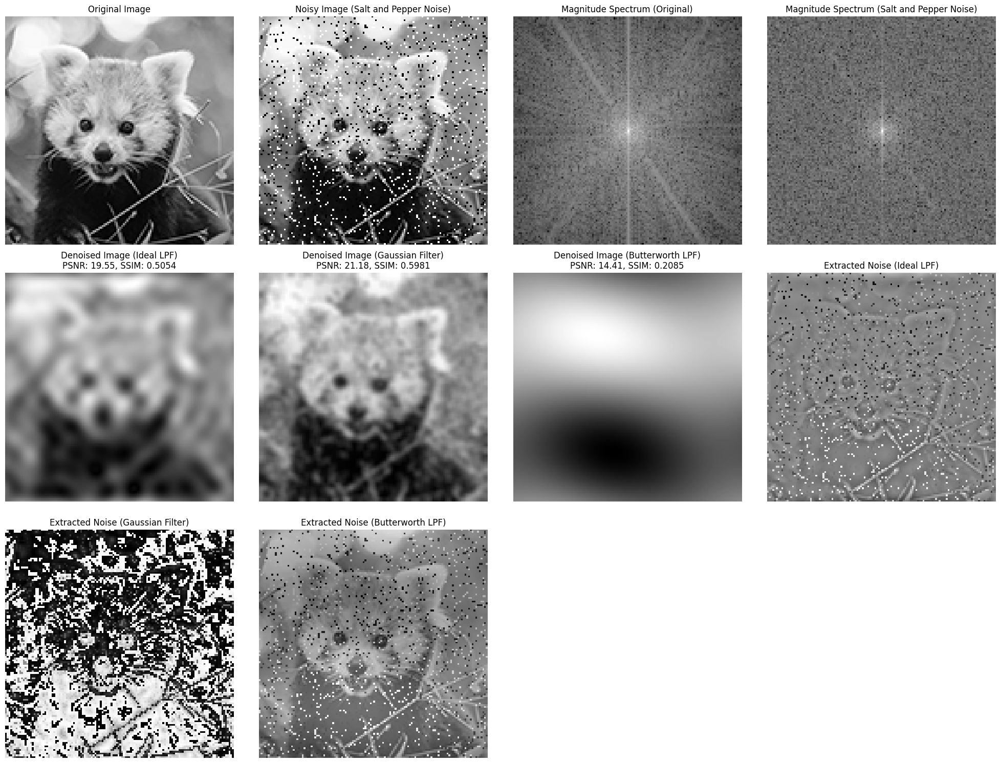

In [55]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

def find_magnitude_spectrum(image):
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift))
    return magnitude_spectrum

# Function to add noise to an image
def add_noise(image, noise_type='gaussian', mean=0, std_dev=20, salt_pepper_amount=0.05):
    noisy_image = np.copy(image)
    if noise_type == 'gaussian':
        gaussian_noise = np.random.normal(mean, std_dev, image.shape)
        noisy_image += gaussian_noise.astype(np.uint8)
    elif noise_type == 'salt_and_pepper':
        salt_pepper = np.random.rand(*image.shape)
        noisy_image[salt_pepper < salt_pepper_amount] = 0  # Increased threshold for salt
        noisy_image[salt_pepper > 1 - salt_pepper_amount] = 255  # Increased threshold for pepper
    return np.clip(noisy_image, 0, 255)

# Function to remove noise using appropriate filters
def remove_noise(image, filter_type='ideal', kernel_size=3):
    if filter_type == 'ideal':
        rows, cols = image.shape
        crow, ccol = rows // 2, cols // 2
        mask = np.zeros((rows, cols), np.uint8)
        mask[crow - kernel_size:crow + kernel_size, ccol - kernel_size:ccol + kernel_size] = 1
        fshift = np.fft.fftshift(np.fft.fft2(image))
        fshift = fshift * mask
        f_ishift = np.fft.ifftshift(fshift)
        img_back = np.abs(np.fft.ifft2(f_ishift))
        return img_back
    elif filter_type == 'gaussian':
        kernel = cv2.getGaussianKernel(kernel_size, kernel_size / 3)
        kernel2d = np.outer(kernel, kernel.transpose())
        denoised_image = cv2.filter2D(image, -1, kernel2d)
        return denoised_image
    elif filter_type == 'blpf':
        rows, cols = image.shape
        crow, ccol = rows // 2, cols // 2
        mask = np.zeros((rows, cols), np.uint8)
        for i in range(rows):
            for j in range(cols):
                d = np.sqrt((i - crow) ** 2 + (j - ccol) ** 2)
                mask[i, j] = 1 / (1 + (d / kernel_size) ** (2 * kernel_size))
        fshift = np.fft.fftshift(np.fft.fft2(image))
        fshift = fshift * mask
        f_ishift = np.fft.ifftshift(fshift)
        img_back = np.abs(np.fft.ifft2(f_ishift))
        return img_back

# Function to compute PSNR and SSIM
def compute_metrics(original_image, denoised_image):
    psnr = peak_signal_noise_ratio(original_image, denoised_image)
    ssim = structural_similarity(original_image, denoised_image)
    return psnr, ssim

# Load images from the dataset
image_paths = ['/content/panda.png']
images = [cv2.imread(path, cv2.IMREAD_GRAYSCALE) for path in image_paths]

# Create noisy versions of the images
noisy_images_salt_pepper = [add_noise(image, noise_type='salt_and_pepper', salt_pepper_amount=0.05) for image in images]

# Display original images, noisy versions, magnitude spectrum, noise removed images, PSNR, and SSIM
for original_image, noisy_image_salt_pepper, image_path in zip(images, noisy_images_salt_pepper, image_paths):
    # Display original and noisy images
    plt.figure(figsize=(20, 15))

    plt.subplot(3, 4, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(3, 4, 2)
    plt.imshow(noisy_image_salt_pepper, cmap='gray')
    plt.title('Noisy Image (Salt and Pepper Noise)')
    plt.axis('off')

    # Display magnitude spectrum of noisy images
    plt.subplot(3, 4, 3)
    plt.imshow(find_magnitude_spectrum(original_image), cmap='gray')
    plt.title('Magnitude Spectrum (Original)')
    plt.axis('off')

    plt.subplot(3, 4, 4)
    plt.imshow(find_magnitude_spectrum(noisy_image_salt_pepper), cmap='gray')
    plt.title('Magnitude Spectrum (Salt and Pepper Noise)')
    plt.axis('off')

    # Remove noise using appropriate filters
    denoised_image_ideal = remove_noise(noisy_image_salt_pepper, filter_type='ideal', kernel_size=10)
    denoised_image_gaussian = remove_noise(noisy_image_salt_pepper, filter_type='gaussian', kernel_size=5)
    denoised_image_blpf = remove_noise(noisy_image_salt_pepper, filter_type='blpf', kernel_size=10)

    # Compute PSNR and SSIM for the denoised images
    psnr_ideal, ssim_ideal = compute_metrics(original_image, denoised_image_ideal)
    psnr_gaussian, ssim_gaussian = compute_metrics(original_image, denoised_image_gaussian)
    psnr_blpf, ssim_blpf = compute_metrics(original_image, denoised_image_blpf)

    # Display noise removed images along with PSNR and SSIM values
    plt.subplot(3, 4, 5)
    plt.imshow(denoised_image_ideal, cmap='gray')
    plt.title(f'Denoised Image (Ideal LPF)\nPSNR: {psnr_ideal:.2f}, SSIM: {ssim_ideal:.4f}')
    plt.axis('off')

    plt.subplot(3, 4, 6)
    plt.imshow(denoised_image_gaussian, cmap='gray')
    plt.title(f'Denoised Image (Gaussian Filter)\nPSNR: {psnr_gaussian:.2f}, SSIM: {ssim_gaussian:.4f}')
    plt.axis('off')

    plt.subplot(3, 4, 7)
    plt.imshow(denoised_image_blpf, cmap='gray')
    plt.title(f'Denoised Image (Butterworth LPF)\nPSNR: {psnr_blpf:.2f}, SSIM: {ssim_blpf:.4f}')
    plt.axis('off')

    # Display extracted noise
    plt.subplot(3, 4, 8)
    plt.imshow(noisy_image_salt_pepper - denoised_image_ideal, cmap='gray')
    plt.title('Extracted Noise (Ideal LPF)')
    plt.axis('off')

    plt.subplot(3, 4, 9)
    plt.imshow(noisy_image_salt_pepper - denoised_image_gaussian, cmap='gray')
    plt.title('Extracted Noise (Gaussian Filter)')
    plt.axis('off')

    plt.subplot(3, 4, 10)
    plt.imshow(noisy_image_salt_pepper - denoised_image_blpf, cmap='gray')
    plt.title('Extracted Noise (Butterworth LPF)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


<ipython-input-56-77f014c41df6>:57: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr = peak_signal_noise_ratio(original_image, denoised_image)


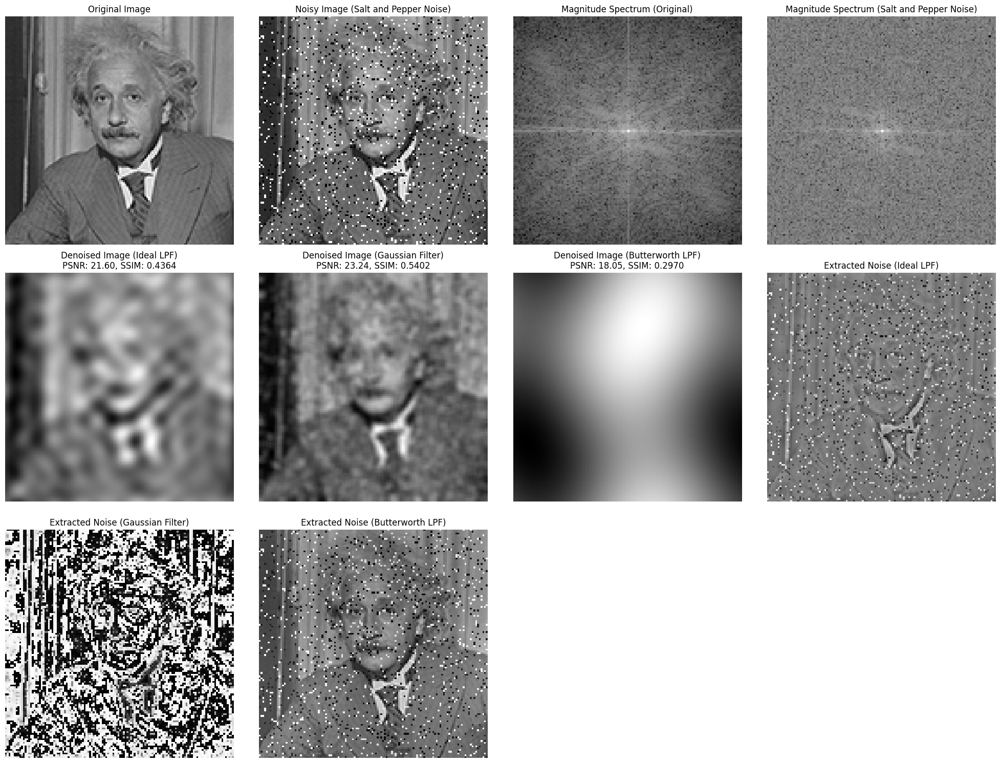

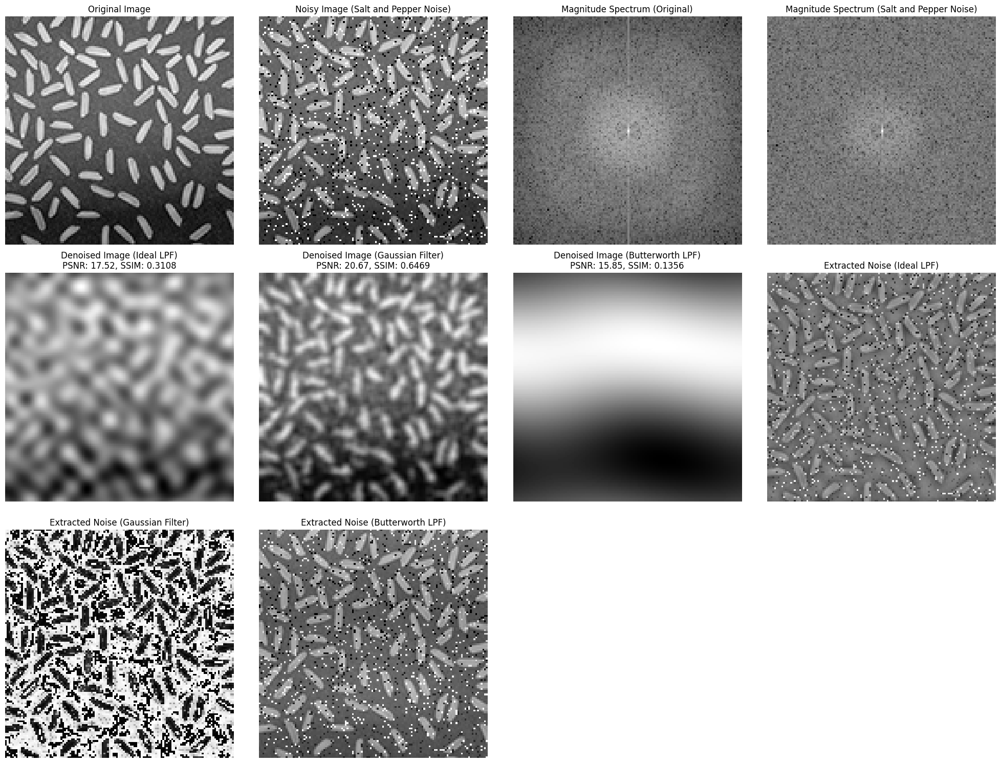

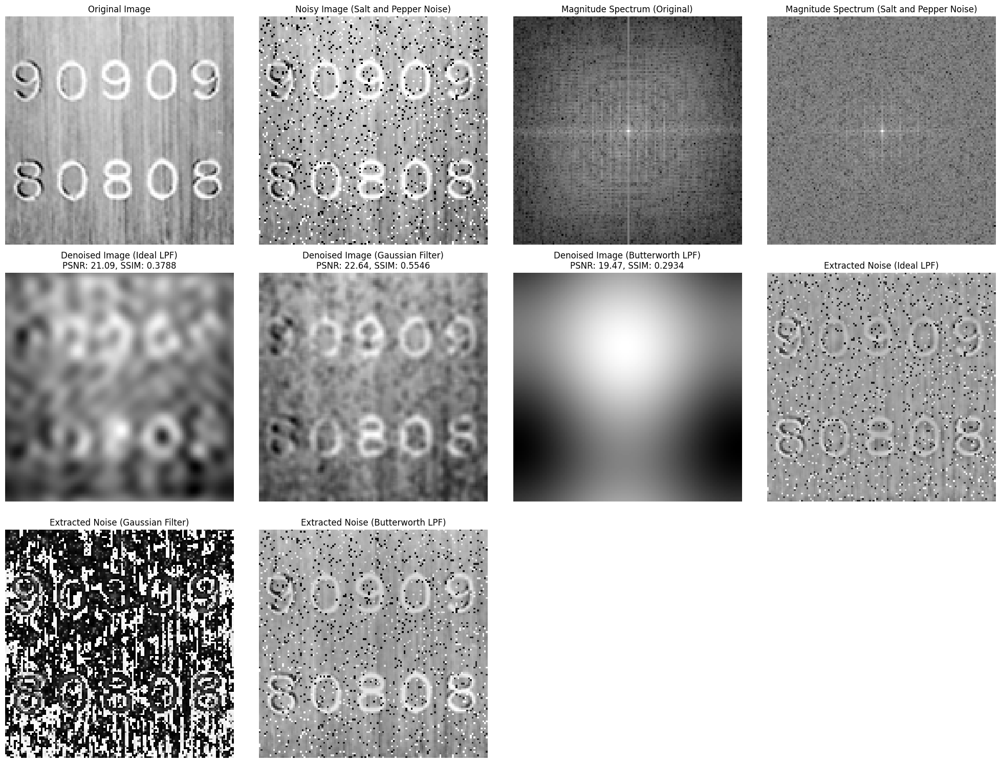

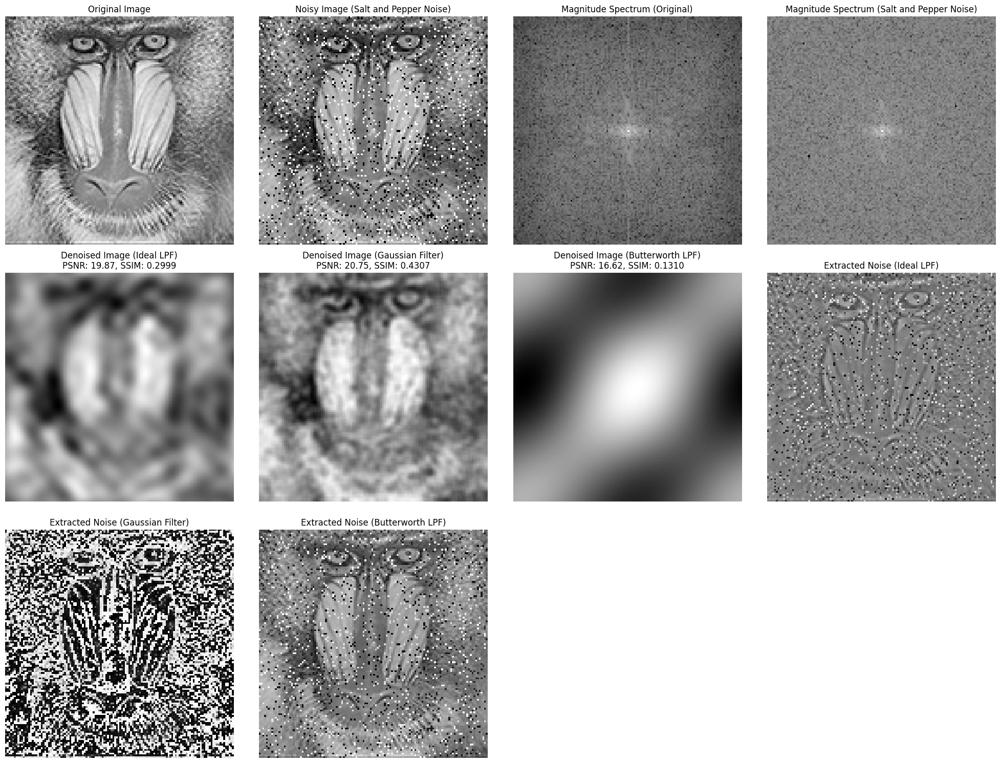

In [56]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

def find_magnitude_spectrum(image):
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift))
    return magnitude_spectrum

# Function to add noise to an image
def add_noise(image, noise_type='gaussian', mean=0, std_dev=20, salt_pepper_amount=0.05):
    noisy_image = np.copy(image)
    if noise_type == 'gaussian':
        gaussian_noise = np.random.normal(mean, std_dev, image.shape)
        noisy_image += gaussian_noise.astype(np.uint8)
    elif noise_type == 'salt_and_pepper':
        salt_pepper = np.random.rand(*image.shape)
        noisy_image[salt_pepper < salt_pepper_amount] = 0  # Increased threshold for salt
        noisy_image[salt_pepper > 1 - salt_pepper_amount] = 255  # Increased threshold for pepper
    return np.clip(noisy_image, 0, 255)

# Function to remove noise using appropriate filters
def remove_noise(image, filter_type='ideal', kernel_size=3):
    if filter_type == 'ideal':
        rows, cols = image.shape
        crow, ccol = rows // 2, cols // 2
        mask = np.zeros((rows, cols), np.uint8)
        mask[crow - kernel_size:crow + kernel_size, ccol - kernel_size:ccol + kernel_size] = 1
        fshift = np.fft.fftshift(np.fft.fft2(image))
        fshift = fshift * mask
        f_ishift = np.fft.ifftshift(fshift)
        img_back = np.abs(np.fft.ifft2(f_ishift))
        return img_back
    elif filter_type == 'gaussian':
        kernel = cv2.getGaussianKernel(kernel_size, kernel_size / 3)
        kernel2d = np.outer(kernel, kernel.transpose())
        denoised_image = cv2.filter2D(image, -1, kernel2d)
        return denoised_image
    elif filter_type == 'blpf':
        rows, cols = image.shape
        crow, ccol = rows // 2, cols // 2
        mask = np.zeros((rows, cols), np.uint8)
        for i in range(rows):
            for j in range(cols):
                d = np.sqrt((i - crow) ** 2 + (j - ccol) ** 2)
                mask[i, j] = 1 / (1 + (d / kernel_size) ** (2 * kernel_size))
        fshift = np.fft.fftshift(np.fft.fft2(image))
        fshift = fshift * mask
        f_ishift = np.fft.ifftshift(fshift)
        img_back = np.abs(np.fft.ifft2(f_ishift))
        return img_back

# Function to compute PSNR and SSIM
def compute_metrics(original_image, denoised_image):
    psnr = peak_signal_noise_ratio(original_image, denoised_image)
    ssim = structural_similarity(original_image, denoised_image)
    return psnr, ssim

# Load images from the dataset
image_paths = ['/content/einstein.png', '/content/rice.png', '/content/code.png', '/content/mandrill.png']
images = [cv2.imread(path, cv2.IMREAD_GRAYSCALE) for path in image_paths]

# Create noisy versions of the images
noisy_images_salt_pepper = [add_noise(image, noise_type='salt_and_pepper', salt_pepper_amount=0.05) for image in images]

# Display original images, noisy versions, magnitude spectrum, noise removed images, PSNR, and SSIM
for original_image, noisy_image_salt_pepper, image_path in zip(images, noisy_images_salt_pepper, image_paths):
    # Display original and noisy images
    plt.figure(figsize=(20, 15))

    plt.subplot(3, 4, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(3, 4, 2)
    plt.imshow(noisy_image_salt_pepper, cmap='gray')
    plt.title('Noisy Image (Salt and Pepper Noise)')
    plt.axis('off')

    # Display magnitude spectrum of noisy images
    plt.subplot(3, 4, 3)
    plt.imshow(find_magnitude_spectrum(original_image), cmap='gray')
    plt.title('Magnitude Spectrum (Original)')
    plt.axis('off')

    plt.subplot(3, 4, 4)
    plt.imshow(find_magnitude_spectrum(noisy_image_salt_pepper), cmap='gray')
    plt.title('Magnitude Spectrum (Salt and Pepper Noise)')
    plt.axis('off')

    # Remove noise using appropriate filters
    denoised_image_ideal = remove_noise(noisy_image_salt_pepper, filter_type='ideal', kernel_size=10)
    denoised_image_gaussian = remove_noise(noisy_image_salt_pepper, filter_type='gaussian', kernel_size=5)
    denoised_image_blpf = remove_noise(noisy_image_salt_pepper, filter_type='blpf', kernel_size=10)

    # Compute PSNR and SSIM for the denoised images
    psnr_ideal, ssim_ideal = compute_metrics(original_image, denoised_image_ideal)
    psnr_gaussian, ssim_gaussian = compute_metrics(original_image, denoised_image_gaussian)
    psnr_blpf, ssim_blpf = compute_metrics(original_image, denoised_image_blpf)

    # Display noise removed images along with PSNR and SSIM values
    plt.subplot(3, 4, 5)
    plt.imshow(denoised_image_ideal, cmap='gray')
    plt.title(f'Denoised Image (Ideal LPF)\nPSNR: {psnr_ideal:.2f}, SSIM: {ssim_ideal:.4f}')
    plt.axis('off')

    plt.subplot(3, 4, 6)
    plt.imshow(denoised_image_gaussian, cmap='gray')
    plt.title(f'Denoised Image (Gaussian Filter)\nPSNR: {psnr_gaussian:.2f}, SSIM: {ssim_gaussian:.4f}')
    plt.axis('off')

    plt.subplot(3, 4, 7)
    plt.imshow(denoised_image_blpf, cmap='gray')
    plt.title(f'Denoised Image (Butterworth LPF)\nPSNR: {psnr_blpf:.2f}, SSIM: {ssim_blpf:.4f}')
    plt.axis('off')

    # Display extracted noise
    plt.subplot(3, 4, 8)
    plt.imshow(noisy_image_salt_pepper - denoised_image_ideal, cmap='gray')
    plt.title('Extracted Noise (Ideal LPF)')
    plt.axis('off')

    plt.subplot(3, 4, 9)
    plt.imshow(noisy_image_salt_pepper - denoised_image_gaussian, cmap='gray')
    plt.title('Extracted Noise (Gaussian Filter)')
    plt.axis('off')

    plt.subplot(3, 4, 10)
    plt.imshow(noisy_image_salt_pepper - denoised_image_blpf, cmap='gray')
    plt.title('Extracted Noise (Butterworth LPF)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


<ipython-input-57-a2d986f2ff12>:57: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr = peak_signal_noise_ratio(original_image, denoised_image)
<ipython-input-57-a2d986f2ff12>:9: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(np.abs(fshift))


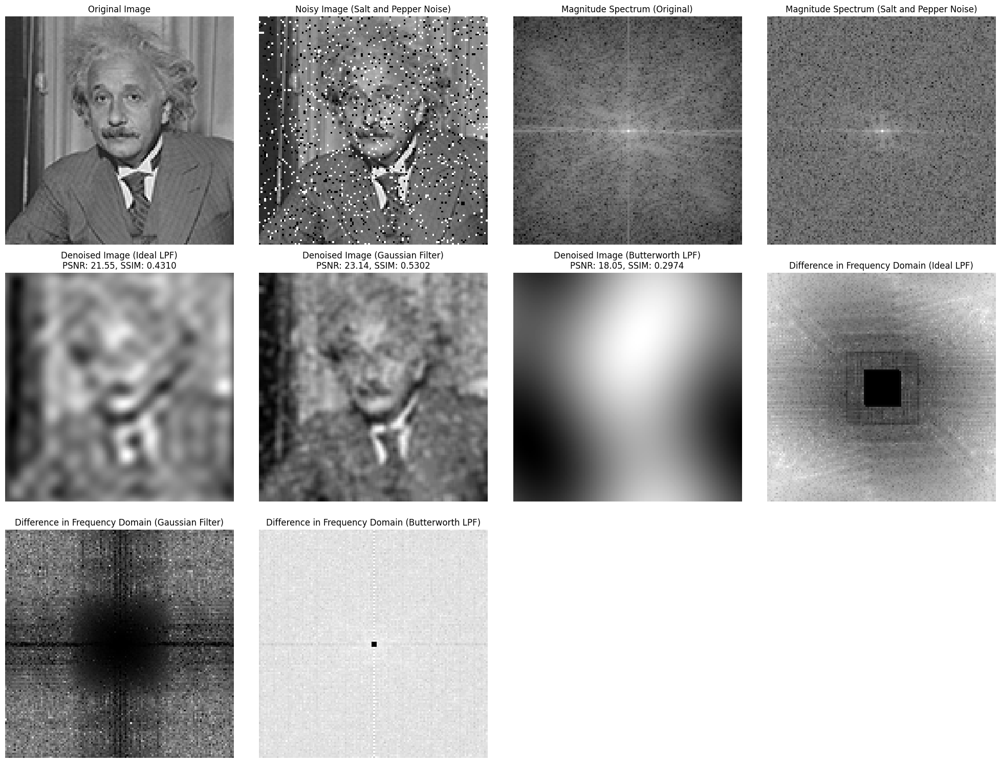

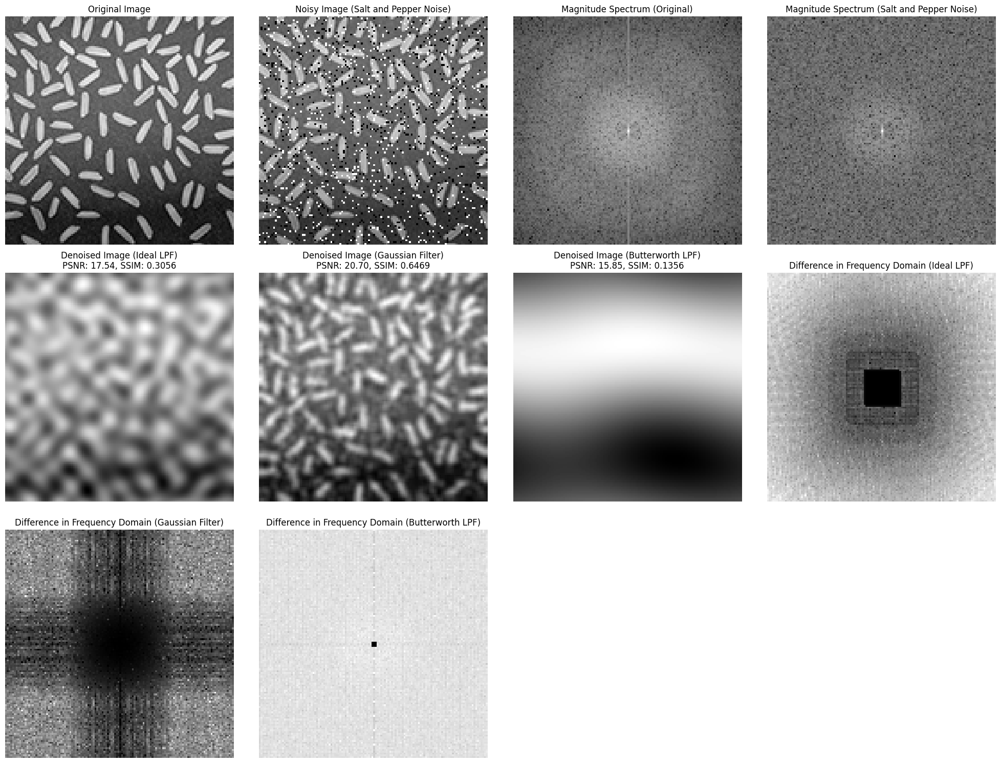

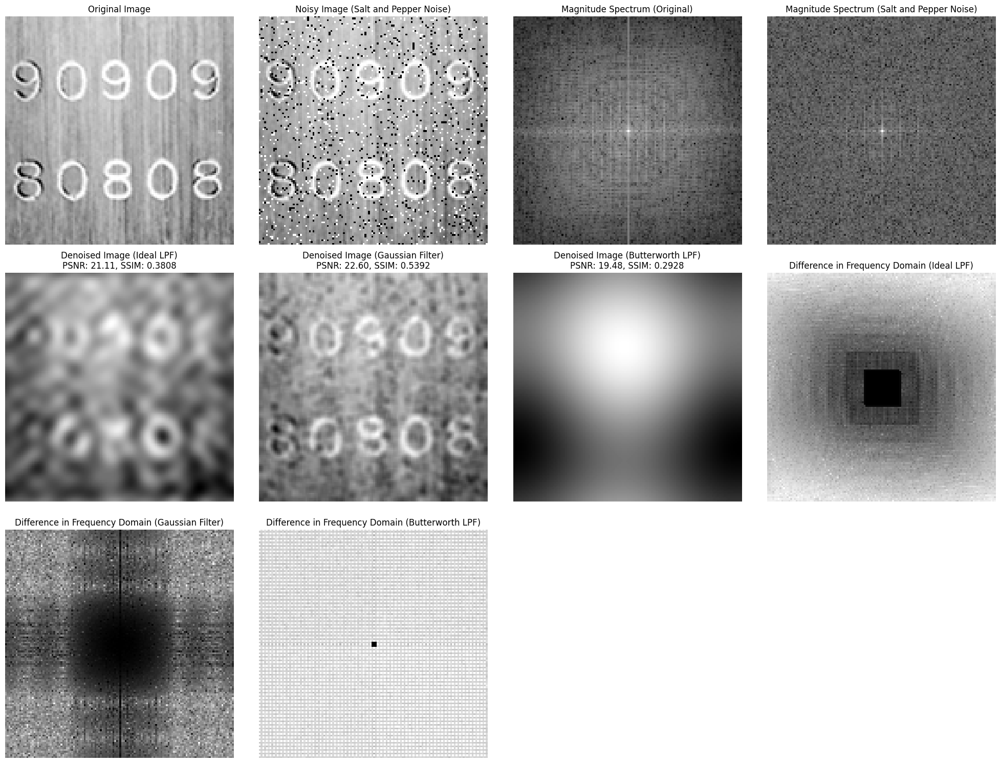

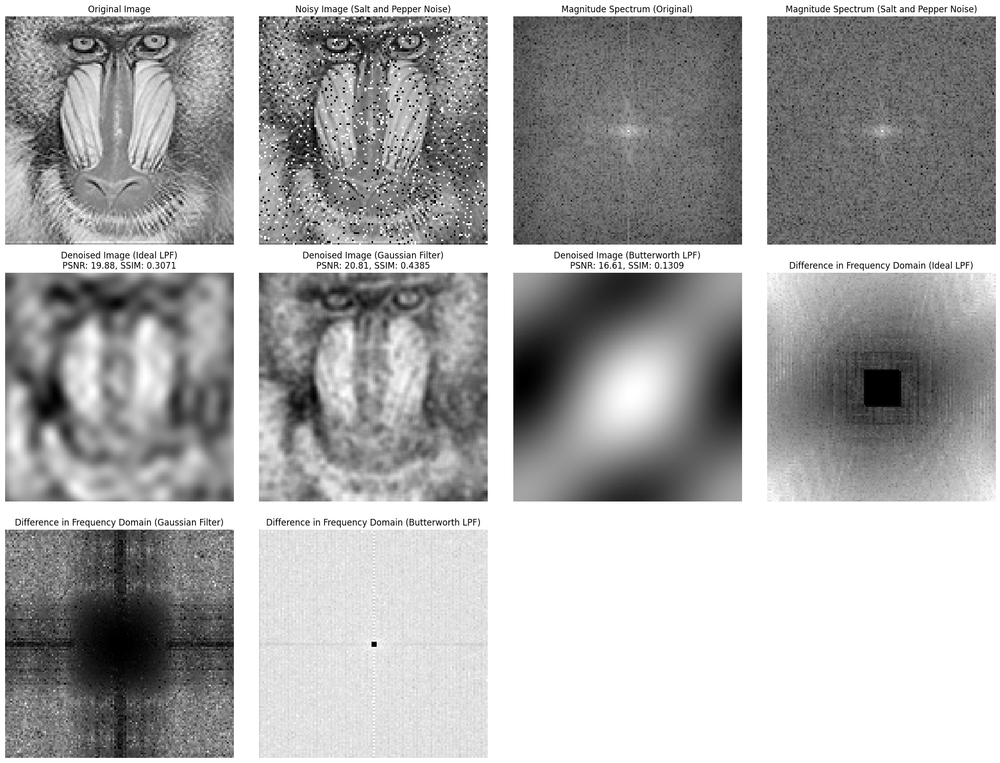

In [57]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

def find_magnitude_spectrum(image):
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift))
    return magnitude_spectrum

# Function to add noise to an image
def add_noise(image, noise_type='gaussian', mean=0, std_dev=20, salt_pepper_amount=0.05):
    noisy_image = np.copy(image)
    if noise_type == 'gaussian':
        gaussian_noise = np.random.normal(mean, std_dev, image.shape)
        noisy_image += gaussian_noise.astype(np.uint8)
    elif noise_type == 'salt_and_pepper':
        salt_pepper = np.random.rand(*image.shape)
        noisy_image[salt_pepper < salt_pepper_amount] = 0  # Increased threshold for salt
        noisy_image[salt_pepper > 1 - salt_pepper_amount] = 255  # Increased threshold for pepper
    return np.clip(noisy_image, 0, 255)

# Function to remove noise using appropriate filters
def remove_noise(image, filter_type='ideal', kernel_size=3):
    if filter_type == 'ideal':
        rows, cols = image.shape
        crow, ccol = rows // 2, cols // 2
        mask = np.zeros((rows, cols), np.uint8)
        mask[crow - kernel_size:crow + kernel_size, ccol - kernel_size:ccol + kernel_size] = 1
        fshift = np.fft.fftshift(np.fft.fft2(image))
        fshift = fshift * mask
        f_ishift = np.fft.ifftshift(fshift)
        img_back = np.abs(np.fft.ifft2(f_ishift))
        return img_back
    elif filter_type == 'gaussian':
        kernel = cv2.getGaussianKernel(kernel_size, kernel_size / 3)
        kernel2d = np.outer(kernel, kernel.transpose())
        denoised_image = cv2.filter2D(image, -1, kernel2d)
        return denoised_image
    elif filter_type == 'blpf':
        rows, cols = image.shape
        crow, ccol = rows // 2, cols // 2
        mask = np.zeros((rows, cols), np.uint8)
        for i in range(rows):
            for j in range(cols):
                d = np.sqrt((i - crow) ** 2 + (j - ccol) ** 2)
                mask[i, j] = 1 / (1 + (d / kernel_size) ** (2 * kernel_size))
        fshift = np.fft.fftshift(np.fft.fft2(image))
        fshift = fshift * mask
        f_ishift = np.fft.ifftshift(fshift)
        img_back = np.abs(np.fft.ifft2(f_ishift))
        return img_back

# Function to compute PSNR and SSIM
def compute_metrics(original_image, denoised_image):
    psnr = peak_signal_noise_ratio(original_image, denoised_image)
    ssim = structural_similarity(original_image, denoised_image)
    return psnr, ssim

# Load images from the dataset
image_paths = ['/content/einstein.png', '/content/rice.png', '/content/code.png', '/content/mandrill.png']
images = [cv2.imread(path, cv2.IMREAD_GRAYSCALE) for path in image_paths]

# Create noisy versions of the images
noisy_images_salt_pepper = [add_noise(image, noise_type='salt_and_pepper', salt_pepper_amount=0.05) for image in images]

# Display original images, noisy versions, magnitude spectrum, noise removed images, PSNR, and SSIM
for original_image, noisy_image_salt_pepper, image_path in zip(images, noisy_images_salt_pepper, image_paths):
    # Display original and noisy images
    plt.figure(figsize=(20, 15))

    plt.subplot(3, 4, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(3, 4, 2)
    plt.imshow(noisy_image_salt_pepper, cmap='gray')
    plt.title('Noisy Image (Salt and Pepper Noise)')
    plt.axis('off')

    # Display magnitude spectrum of noisy images
    plt.subplot(3, 4, 3)
    plt.imshow(find_magnitude_spectrum(original_image), cmap='gray')
    plt.title('Magnitude Spectrum (Original)')
    plt.axis('off')

    plt.subplot(3, 4, 4)
    plt.imshow(find_magnitude_spectrum(noisy_image_salt_pepper), cmap='gray')
    plt.title('Magnitude Spectrum (Salt and Pepper Noise)')
    plt.axis('off')

    # Remove noise using appropriate filters
    denoised_image_ideal = remove_noise(noisy_image_salt_pepper, filter_type='ideal', kernel_size=10)
    denoised_image_gaussian = remove_noise(noisy_image_salt_pepper, filter_type='gaussian', kernel_size=5)
    denoised_image_blpf = remove_noise(noisy_image_salt_pepper, filter_type='blpf', kernel_size=10)

    # Compute PSNR and SSIM for the denoised images
    psnr_ideal, ssim_ideal = compute_metrics(original_image, denoised_image_ideal)
    psnr_gaussian, ssim_gaussian = compute_metrics(original_image, denoised_image_gaussian)
    psnr_blpf, ssim_blpf = compute_metrics(original_image, denoised_image_blpf)

    # Display noise removed images along with PSNR and SSIM values
    plt.subplot(3, 4, 5)
    plt.imshow(denoised_image_ideal, cmap='gray')
    plt.title(f'Denoised Image (Ideal LPF)\nPSNR: {psnr_ideal:.2f}, SSIM: {ssim_ideal:.4f}')
    plt.axis('off')

    plt.subplot(3, 4, 6)
    plt.imshow(denoised_image_gaussian, cmap='gray')
    plt.title(f'Denoised Image (Gaussian Filter)\nPSNR: {psnr_gaussian:.2f}, SSIM: {ssim_gaussian:.4f}')
    plt.axis('off')

    plt.subplot(3, 4, 7)
    plt.imshow(denoised_image_blpf, cmap='gray')
    plt.title(f'Denoised Image (Butterworth LPF)\nPSNR: {psnr_blpf:.2f}, SSIM: {ssim_blpf:.4f}')
    plt.axis('off')

    # Calculate and display the difference in frequency domain
    diff_spectrum_ideal = np.abs(find_magnitude_spectrum(noisy_image_salt_pepper) - find_magnitude_spectrum(denoised_image_ideal))
    diff_spectrum_gaussian = np.abs(find_magnitude_spectrum(noisy_image_salt_pepper) - find_magnitude_spectrum(denoised_image_gaussian))
    diff_spectrum_blpf = np.abs(find_magnitude_spectrum(noisy_image_salt_pepper) - find_magnitude_spectrum(denoised_image_blpf))

    plt.subplot(3, 4, 8)
    plt.imshow(diff_spectrum_ideal, cmap='gray')
    plt.title('Difference in Frequency Domain (Ideal LPF)')
    plt.axis('off')

    plt.subplot(3, 4, 9)
    plt.imshow(diff_spectrum_gaussian, cmap='gray')
    plt.title('Difference in Frequency Domain (Gaussian Filter)')
    plt.axis('off')

    plt.subplot(3, 4, 10)
    plt.imshow(diff_spectrum_blpf, cmap='gray')
    plt.title('Difference in Frequency Domain (Butterworth LPF)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()
